<a href="https://colab.research.google.com/github/Rahul30032/inside_airbnb_austin/blob/main/unmazer.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

https://docs.google.com/document/d/1yfAtfdc0_mP0nyrCLVA0jEZiu4CHA-Z5OXYvVB6zr1o/edit 

In [51]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt


In [52]:
!pip install shapely
!pip install geopandas
!pip install geojsonio

In [53]:
import geopandas as gpd
import shapely as shp
import geojsonio as gj

In [54]:
from google.colab import drive

In [55]:
drive.mount('/content/gdrive')

Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).


In [56]:
root_path = '/content/gdrive/MyDrive/unmazer.ai'

In [57]:
listings = pd.read_csv(root_path+'/listings.csv')


In [58]:
neighbourhoods_listing = pd.read_csv(root_path+'/neighbourhoods.csv')
neighbourhoods = gpd.read_file(root_path+'/neighbourhoods.geojson')

In [59]:
neighbourhoods.head()

,neighbourhood,neighbourhood_group,geometry
0,78739,None,"MULTIPOLYGON (((-97.89002 30.20941, -97.88929 ..."
1,78754,None,"MULTIPOLYGON (((-97.63658 30.40266, -97.63754 ..."
2,78732,None,"MULTIPOLYGON (((-97.87303 30.43806, -97.87335 ..."
3,78737,None,"MULTIPOLYGON (((-98.01876 30.24167, -98.01617 ..."
4,78756,None,"MULTIPOLYGON (((-97.72792 30.32906, -97.72760 ..."


In [60]:
listings.head()

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,2265,Zen-East in the Heart of Austin (monthly rental),2466,Paddy,NaN,78702,30.27750,-97.71398,Entire home/apt,200,7,24,2019-03-16,0.17,3,131
1,5245,"Eco friendly, Colorful, Clean, Cozy monthly share",2466,Paddy,NaN,78702,30.27577,-97.71379,Private room,114,30,9,2018-03-14,0.06,3,0
2,5456,"Walk to 6th, Rainey St and Convention Ctr",8028,Sylvia,NaN,78702,30.26112,-97.73448,Entire home/apt,104,2,543,2021-02-01,3.74,1,354
3,5636,"Soco, Barton Springs Private Guest Cottage",7148,Peggy,NaN,78704,30.24630,-97.76361,Entire home/apt,46,30,21,2020-11-06,0.15,2,67
4,5769,NW Austin Room,8186,Elizabeth,NaN,78729,30.45697,-97.78422,Private room,39,1,259,2021-02-10,1.96,1,79


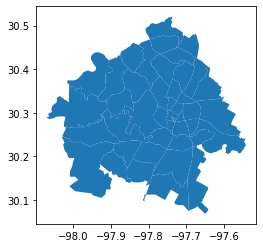

In [61]:
neighbourhoods.plot()

In [62]:
m = folium.Map([43, -100], zoom_start=4)

folium.Choropleth(
    geo_data=neighbourhoods,
    # data=listings,
    # columns=["neighbourhood", "room_type"],
    # key_on="feature.id",
).add_to(m)

m

In [63]:
listing_count = listings.groupby(["neighbourhood"])["host_name"].count()

In [64]:
len(listing_count)

44

List of top neighbourhoods with listing counts.

In [65]:
listing_count.sort_values(ascending=False)

neighbourhood
78704    1821
78702    1263
78701     713
78741     621
78703     530
78745     513
78705     505
78751     478
78723     313
78758     298
78746     256
78734     227
78757     205
78721     204
78722     197
78744     172
78748     148
78756     129
78729     124
78731     120
78752     116
78749     110
78754     106
78753     103
78735     100
78727      99
78737      97
78759      85
78717      74
78733      67
78724      62
78728      60
78736      49
78732      47
78738      44
78725      42
78750      41
78747      40
78730      37
78739      25
78726      15
78742       5
78719       4
78712       2
Name: host_name, dtype: int64

In [66]:
host_listing_count = listings.groupby("host_name")["host_name"].count()

Top 10 hosts by listing counts (top 10 hosts by their total number of listings)

In [67]:
host_listing_count.sort_values(ascending=False)[:10]

host_name
Kia                         398
WanderJaunt                 131
TurnKey Vacation Rentals    124
Martin                      101
Michael                      98
David                        76
Sarah                        74
Ryan                         67
James                        62
Renters Club                 56
Name: host_name, dtype: int64

In [68]:
#chlorpleth map of austin with pointers showing host_name and room_type
m = folium.Map(location=[np.median(listings['latitude'].tolist()),
                         np.median(listings['longitude'].tolist())],
                zoom_start=12)

## add chloropleth layer
m.choropleth(
    geo_data=neighbourhoods,
    name='Listings_per_neighbourhood'
)  

# add markers with basic information
fg = folium.FeatureGroup(name='Neighbourhood Info')
for lat, lon, val, name in zip(listings['latitude'].tolist(),
                               listings['longitude'].tolist(),
                               listings['room_type'].tolist(),
                               listings['host_name'].tolist()):
    html = f"""
    <h2>{name}<\h2><br>
    <h4>Listing_type: {val} <\h4>
    """
    fg.add_child(folium.Marker(location=[lat, lon], popup=html))

m.add_child(fg)

# enable layers to be turned in or out
folium.LayerControl().add_to(m)

/usr/local/lib/python3.7/dist-packages/folium/folium.py:426: FutureWarning: The choropleth  method has been deprecated. Instead use the new Choropleth class, which has the same arguments. See the example notebook 'GeoJSON_and_choropleth' for how to do this.
  FutureWarning


In [69]:
m

In [70]:
m.save('sample.html')

#Some insights/ metrics 
* Reviews and Reviews per month can be normalised based on no of day listing is open out of 365 days (converting it to months) so that just because a listing open for more no of days, it shouldn't have an advantage by having more reviews. (In case we analysing for favourable listing for a givn neighbourhood)
* Correlation between price range, room_type and neighbourhood can be studied/analysed 